# EPIDEMIOLOGÍA SOCIAL II 
# Repaso de conceptos de regresión lineal y logística 

En este cuaderno vamos a repasar concpetos básicos de regresión lineal simple y múltiple y de regresión logística utilizando bases de datos de la NHANES y DHS. Después de realizar el taller debe quedar claro cómo realizar un análisis descriptivo básico, interpretar modelos de regresión con variables continuas y categóricas, verificar los supuestos más importantes de la regresión lineal y entender qué es la regresión logística y cómo se interpretan sus coeficientes.

## Regresión lineal simple

**Vamos a analizar la relación entre la altura y peso de los hombres utilizando datos de la encuesta de Estados Unidos NHANES.**

La Encuesta Nacional de Salud y Nutrición (NHANES) esta diseñada para evaluar el estado de salud y nutrición de adultos y niños en los Estados Unidos. La metodología de la encuesta es única porque combina entrevistas y exámenes físicos. NHANES es una fuente de información importante para el control y la prevención de enfermedades y es una de las fuentes de información principales para producir estadísticas vitales y de salud para la nación. La encuesta examina una muestra representativa a nivel nacional de unas 5.000 personas cada año. Estas personas se encuentran en condados de todo el país, 15 de los cuales son visitados cada año.

La entrevista de NHANES incluye preguntas demográficas, socioeconómicas y relacionadas con la salud. El componente de examen consta de mediciones médicas, dentales y fisiológicas, así como pruebas de laboratorio administradas por personal médico altamente capacitado. Los resultados de esta encuesta se utilizarán para determinar la prevalencia de enfermedades importantes y los factores de riesgo de enfermedades. La información se utilizará para evaluar el estado nutricional y su asociación con la promoción de la salud y la prevención de enfermedades. Los hallazgos de NHANES también son la base de los estándares nacionales para medidas como la altura, el peso y la presión arterial. Los datos de esta encuesta se utilizarán en estudios epidemiológicos e investigaciones en ciencias de la salud, que ayudarán a desarrollar políticas sólidas de salud pública, dirigir y diseñar programas y servicios de salud y ampliar el conocimiento de la salud.

In [1]:
*Cargar base de datos
use peso_altura
*Ver variables de la base de datos
describe
list in 1/20




Contains data from peso_altura.dta
  obs:         4,915                          
 vars:             3                          30 Sep 2020 20:30
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
sex             byte    %9.0g      sex        1=male, 2=female
height          float   %9.0g                 height (cm)
weight          float   %9.0g                 weight (kg)
--------------------------------------------------------------------------------
Sorted by: 


     +-------------------------+
     |  sex    height   weight |
     |-------------------------|
  1. | Male   174.598    62.48 |
  2. | Male   176.598    65.43 |
  3. | Male   171.098    73.03 |
  4. | Male   169.297    68.72 |
  5. | Male   170.098     52.5 |
     |-------------------------|
  6. | Male   17

In [2]:
*La base de datos ya esta filtrada sólo para las observaciones de los hombres. Podemos verificar de la siguiente forma
drop if sex==2 //no se eliminan observaciones

(0 observations deleted)


**Ejercicio 1.1 Análisis univariado**

Realicen un análisis descriptivo de la variable peso y altura. Esto debe incluir: observar los valores de la media, la desviación estándar, la curtosis y la asimetría; generar histograma 

**¿Que ven?** 



                         weight (kg)
-------------------------------------------------------------
      Percentiles      Smallest
 1%        51.03          30.84
 5%        58.17           41.5
10%        61.92          43.21       Obs               4,915
25%        68.61          43.77       Sum of Wgt.       4,915

50%        76.89                      Mean           77.98423
                        Largest       Std. Dev.      13.63785
75%        85.62         144.24
90%        95.14         149.69       Variance        185.991
95%        102.4         158.53       Skewness       .7364373
99%       116.92         175.88       Kurtosis       4.684784

(bin=36, start=30.84, width=4.028889)


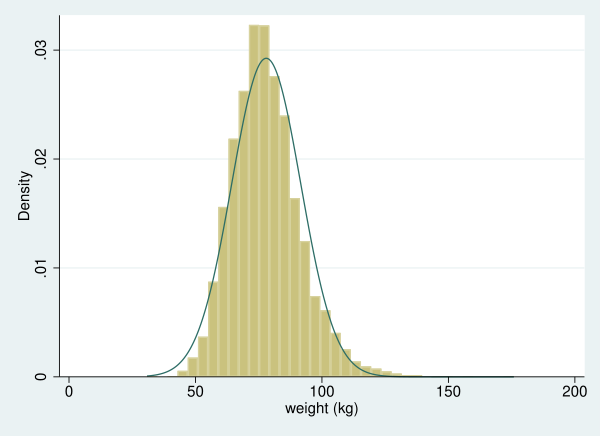




                         height (cm)
-------------------------------------------------------------
      Percentiles      Smallest
 1%      157.297        144.797
 5%      162.797        146.598
10%      165.598        146.898       Obs               4,915
25%      170.199          147.5       Sum of Wgt.       4,915

50%      174.598                      Mean           174.7421
                        Largest       Std. Dev.      7.196115
75%        179.5        198.199
90%      183.797        198.297       Variance       51.78407
95%      186.398            200       Skewness      -.0863815
99%      191.199            200       Kurtosis        3.19693

(bin=36, start=144.797, width=1.5334167)


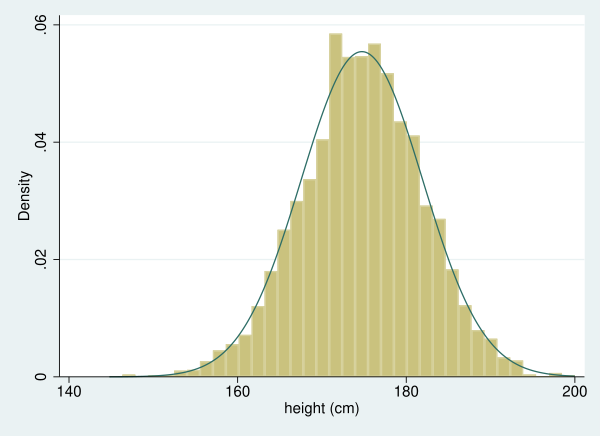

In [3]:
//Estadísticas de resumen 
sum weight, detail 
hist weight, normal 

sum height, detail 
hist height, normal

**Respuesta Ejercicio 1.1**

**Peso:**

Media:77.98kg<br/>
Mediana:76.89kg<br/>
Std: 13.637kg<br/>
Curtosis: 4.684784<br/>
La curtosis indica la manera en que las colas de una distribución difieren de la distribución normal.La distribución tiene colas más pesadas que la distribución normal<br/>
Asimetría:.7364373<br/>
La asimetría es el grado en que los datos no son simétricos. El hecho de que el valor de la asimetría sea 0, positivo o negativo, revela información sobre la forma de los datos.<br/>

**Altura:**

Media:174.7421cm<br/>
Mediana:174.598<br/>
Std:7.196cm<br/>
Curtosis: 3.19693<br/>
La curtosis indica la manera en que las colas de una distribución difieren de la distribución normal. La distribución tiene colas más pesadas que la distribución normal<br/>
Asimetría:-.0863815<br/>
La asimetría es el grado en que los datos no son simétricos. El hecho de que el valor de la asimetría sea 0, positivo o negativo, revela información sobre la forma de los datos.


**Ejercicio 1.2 Análisis bivariado**

Después de examinar las variables individualmente, grafique el peso versus la altura y calcule el coeficiente de correlación. 

**¿Que ven?**

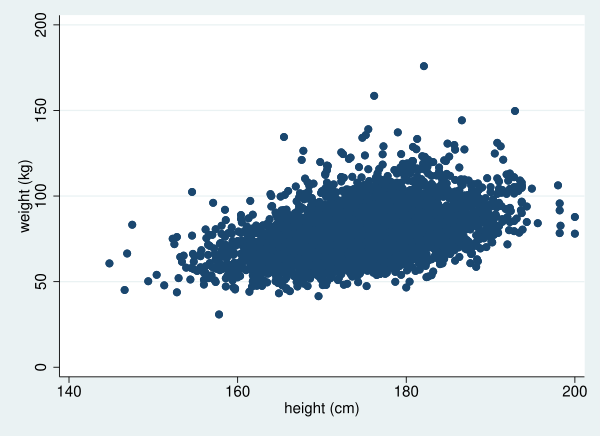

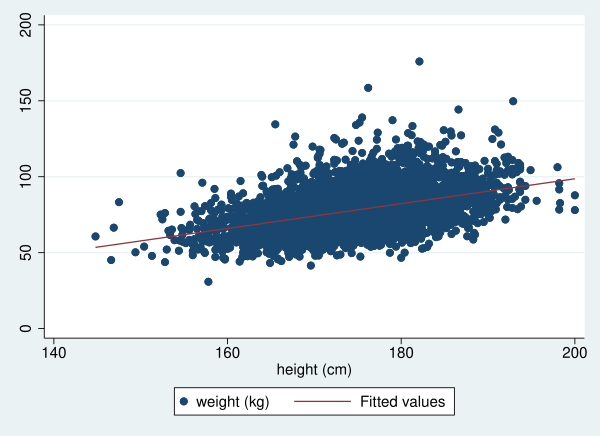






(obs=4,915)

             |   weight   height
-------------+------------------
      weight |   1.0000
      height |   0.4318   1.0000



In [4]:
//Gráfico de dispersión entre altura y peso
scatter weight height
//Aregar la linea de regresión
scatter weight height || lfit weight height
//Calcular correlación de pearson
corr weight height

**Respuesta ejercicio 1.2**

**Fuerza**: una relación moderada dado que existe cierto grado de dispersión en los valores de peso para un valor específico de altura (pcorr = 0.43).<br/>
**Dirección**: tendencia positiva, pues a medida que aumenta la altura también aumenta el peso.<br/>
**Forma**: gráficamente parece que la relación es lineal.

Parece razonable pensar en un modelo de regresión lineal para intentar explicar el peso a partir de la altura.

**Ejercicio 1.3 Modelo de regresión simple**

Ajuste un modelo de regresión lineal simple. Comente sobre los siguientes resultados del modelo: 

1. Coeficiente de determinación ($R^2$)
2. Interprete la prueba de hipótesis global del modelo ($Prueba-F$)
3. Interprete los coeficientes del modelo ($\beta_{o}$ y $\beta_{1}$)
4. Escriba la ecuación del modelo
5. Analice: Popularmente la gente dice que debes pesar en kg, tu altura menos 1 metro. ¿Esto está cerca de lo que ve aquí? Hacer ejemplo con 180 cm de altura

In [5]:
regress weight height
dis "El peso de la persona de 180cm de altura sería de" " " -65.00393 + 0.8182*180 " " "kg."



      Source |       SS           df       MS      Number of obs   =     4,915
-------------+----------------------------------   F(1, 4913)      =   1125.80
       Model |  170387.045         1  170387.045   Prob > F        =    0.0000
    Residual |  743572.882     4,913  151.348032   R-squared       =    0.1864
-------------+----------------------------------   Adj R-squared   =    0.1863
       Total |  913959.926     4,914  185.991031   Root MSE        =    12.302

------------------------------------------------------------------------------
      weight |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
      height |   .8182813   .0243878    33.55   0.000     .7704703    .8660923
       _cons |  -65.00393   4.265187   -15.24   0.000     -73.3656   -56.64226
------------------------------------------------------------------------------

El peso de la persona de 180cm de altura sería d

**Respuesta ejercicio 1.3**

1. $R^2$: A partir de una relación lineal, la altura explica el 18.6% de la varianza del peso.
2. **Prueba global**: De la tabla de análisis de varianza podemos comprobar que nuestro modelo es estadísticamente significativo, pues el valor-p asociado a nuestro estadístico F es inferior a 0.01 y, por tanto, podemos concluir que existe relación lineal entre la altura y el peso. 
3. $\beta_{1}$: En promedio, por un aumento en un centimetro de altura el peso va a aumentar en 0.81kg.  
4. $\beta_{0}$: Cuando la altura es cero, en promedio el peso toma un valor de -65.00kg. Este es un intercepto puramente teórico dado que no tiene sentido evaluar el peso en 0.

Ecuación del modelo 

$\hat{y} = -65.00393 + \beta_{1}*Altura$

5. El peso de la persona de 180 cm es de 82.3kg. Parece que el modelo concuerda con el dicho popular.

## Regresión lineal múltiple

**Primero vamos a estudiar la relación entre peso al nacer y el índice de riqueza a partir de una base modelo de la DHS (la base de datos modelo que utilizaremos para este ejercicio no representa datos reales de un país).**

El objetivo general de la ENDS es establecer los cambios demográficos de la población ocurridos en un periodo específico, y obtener información actualizada sobre los conocimientos, actitudes y prácticas en Salud Sexual y Salud Reproductiva de mujeres y hombres en edad fértil. 

Para este ejercicio vamos a trabajar con las siguientes variables: 

1. *Peso al nacer* (pnacer_g): variable que tiene la información del peso al nacer en gramos. 
2. *Índice de riqueza categorizado en quintiles* (quin_riqueza): 
3. *Índice de riqueza continuo* (ind_riqueza): 
4. *Sexo del bebe (sexo)*: 1=Male 2=Female

**Índice de riqueza**

El índice de riqueza es particularmente valioso en países que carecen de datos confiables sobre ingresos y gastos, que son los indicadores tradicionales utilizados para medir la situación económica de los hogares.

El índice de riqueza se contruye a partir de datos recolectados en cuestionarios de hogares. Este cuestionario incluye preguntas sobre artículos de consumo, como un televisor y un automóvil; características de la vivienda como el material del piso; tipo de fuente de agua potable; instalaciones sanitarias; y otras características relacionadas con el estado de riqueza.

A cada activo del hogar para el cual se recopila información se le asigna un puntaje de peso o factor generado a través del análisis de componentes principales. Las puntuaciones de activos resultantes están estandarizadas en relación con una distribución normal estándar con una media de cero y una desviación estándar de uno. Estos puntajes estandarizados se utilizan luego para crear los puntos de ruptura que definen los quintiles de riqueza como de más bajo a más alto.

Página si quieren revisar como se construye el índice de riqueza para Colombia con la información de la DHS: https://dhsprogram.com/topics/wealth-index/Wealth-Index-Construction.cfm

In [6]:
*Cargar base de datos
use peso_riqueza, clear
*Ver variables de la base de datos
describe
*Visualizar datos
list quin_riqueza ind_riqueza sexo pnacer_g in 1/5




Contains data from peso_riqueza.dta
  obs:         1,831                          
 vars:            10                          30 Sep 2020 22:57
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
orden           int     %10.0g                orden
quin_riqueza    byte    %10.0g     hv270_label
                                              hv270
ind_riqueza     long    %10.0g                hv271
sexo            byte    %10.0g     b4_label   b4
pnacer_g        double  %10.0g                pnacer_g
pnacer_g1       double  %10.0g                pnacer_g, hv270 == 1
pnacer_g2       double  %10.0g                pnacer_g, hv270 == 2
pnacer_g3       double  %10.0g                pnacer_g, hv270 == 3
pnacer_g4       double  %10.0g                pnacer_g, hv270 == 4
pnacer_g5  

**Ejercicio 2.1**

Ajuste un modelo de regresión lineal para explicar peso al nacer a partir de la variable de índice de riqueza continua. Interprete los resultados del modelo. 

In [7]:
regress pnacer_g ind_riqueza


      Source |       SS           df       MS      Number of obs   =     1,785
-------------+----------------------------------   F(1, 1783)      =     26.66
       Model |  12795264.3         1  12795264.3   Prob > F        =    0.0000
    Residual |   855689615     1,783  479915.656   R-squared       =    0.0147
-------------+----------------------------------   Adj R-squared   =    0.0142
       Total |   868484879     1,784  486818.878   Root MSE        =    692.76

------------------------------------------------------------------------------
    pnacer_g |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
 ind_riqueza |   .0008732   .0001691     5.16   0.000     .0005415    .0012048
       _cons |   3168.262   16.44191   192.69   0.000     3136.015     3200.51
------------------------------------------------------------------------------


**Respuesta Ejercicio 2.1**

Modelo:
$y_{i} = \beta_{0} + \beta_{1}*IR + \epsilon_{i}$, dónde             $\epsilon  \sim N(0, \sigma)$ <br/>

$\hat{y_{i}} = 3168.262 + .0008732*IR $

Se observa que la variable de índice de riqueza incluida en el modelo como continua está estadísticamente asociada (p < 0.01) con el peso al nacer y explica el 1% de su variabilidad. La interpretación de la regresión es que por cada aumento en una unidad del índice de riqueza, el peso al nacer aumenta en promedio en 0.0009 gramos. El peso promedio al nacer cuando el índice de riqueza es cero es 3168.262 gramos.

**Ejercicio 2.2**

Ajuste un modelo de regresión lineal para explicar peso al nacer a partir de la variable de índice de riqueza categórica. Interprete los resultados del modelo. Además calcule la media del peso al nacer para cada quintil.



      Source |       SS           df       MS      Number of obs   =     1,785
-------------+----------------------------------   F(4, 1780)      =      8.99
       Model |  17192517.9         4  4298129.48   Prob > F        =    0.0000
    Residual |   851292361     1,780  478254.135   R-squared       =    0.0198
-------------+----------------------------------   Adj R-squared   =    0.0176
       Total |   868484879     1,784  486818.878   Root MSE        =    691.56

------------------------------------------------------------------------------
    pnacer_g |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
quin_riqueza |
     Poorer  |   229.5757   42.32296     5.42   0.000     146.5678    312.5837
     Middle  |    208.159   47.23923     4.41   0.000     115.5088    300.8092
     Richer  |   197.3622   56.12608     3.52   0.000      87.2823    307.4422
    Richest  |   243.4088   75.639

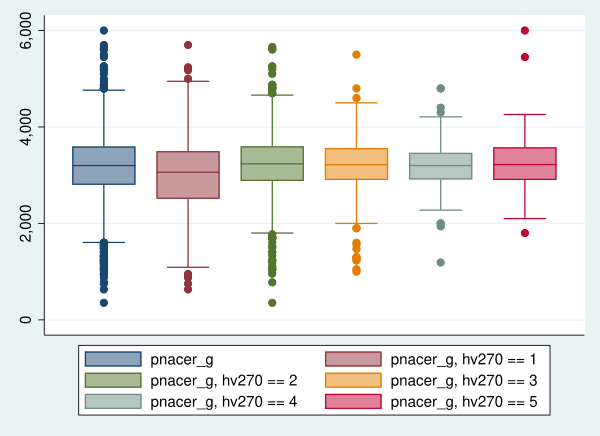

In [8]:
regress pnacer_g i.quin_riqueza

dis "La media de peso al nacer para el quintil Poorest (q1) es de" " " 3002.604 "gramos." 
dis "La media de peso al nacer para el quintil Poorer (q2) es de" " " 3002.604+229.5757 "gramos." 
dis "La media de peso al nacer para el quintil Middle (q3) es de" " " 3002.604+208.159 "gramos." 
dis "La media de peso al nacer para el quintil Richer (q4) es de" " " 3002.604+197.36622 "gramos." 
dis "La media de peso al nacer para el quintil Richest (q5) es de" " " 3002.604+243.4088 "gramos." 

*Grafica de la distribucipon del peso al nacer en cada quintil de riqueza:
graph box pnacer_*

**Respuesta Ejercicio 2.2**

Modelo:
$y_{i} = \beta_{0} + \beta_{1}*Q2 + \beta_{1}*Q3 + \beta_{1}*Q4 + \beta_{1}*Q5 + \epsilon_{i}$, dónde             $\epsilon  \sim N(0, \sigma)$ <br/>

$\hat{y_{i}} =  3002.604 + 229*Q2 + 208*Q3 + 197*Q4 + 243*Q5 $

Se observa que la variable del índice de riqueza incluida en el modelo como dummys (4 dummys) está estadísticamente asociada con el peso al nacer. La asociación con el peso al nacer es lineal ($Prob > F$ = 0.0001) y explica en 1% su variabilidad. En comparación con el primer quintil, en promedio el peso de los recién nacidos en el segundo quintil es 229 g más alto. En promedio, el peso de los recien nacidos en el tercer quintil es 208 gramos más alto comparado con los recién nacidos del primer quintil. En promedio, el peso de los recién nacidos en el tercer quintil es 197 gramos más alto en comparación con el primer quintil y finalmente, los recién nacidos en el quintil más alto tienen un peso promedio más alto en 243 g comparado con los recien nacidos en el primer quintil. La interpretación de la regresión es que todos los quintiles estan asociados significativamente ($P-value < 0.01$) con el peso al nacer.

**Ejercicio 2.3**

Ajuste un modelo de regresión múltiple utilizando como variable dependiente el peso al nacer y como variables independientes el índice de riqueza continuo y el sexo del bebe. Comente los resultados del modelo: ajuste del modelo e interpretación de los coeficientes. Compare con el modelo ajustado en el ejercicio 2.2

In [9]:
regress pnacer_g i.sexo ind_riqueza


      Source |       SS           df       MS      Number of obs   =     1,785
-------------+----------------------------------   F(2, 1782)      =     18.57
       Model |  17726987.6         2   8863493.8   Prob > F        =    0.0000
    Residual |   850757891     1,782  477417.447   R-squared       =    0.0204
-------------+----------------------------------   Adj R-squared   =    0.0193
       Total |   868484879     1,784  486818.878   Root MSE        =    690.95

------------------------------------------------------------------------------
    pnacer_g |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
        sexo |
     Female  |  -105.1857   32.72701    -3.21   0.001     -169.373    -40.9983
 ind_riqueza |   .0008563   .0001687     5.07   0.000     .0005253    .0011872
       _cons |   3220.056   22.99175   140.05   0.000     3174.962     3265.15
-----------------------------------

**Respuesta Ejercicio 2.3**

Modelo:
$y_{i} = \beta_{0} + \beta_{1}*Sexo + \beta_{1}*IR + \epsilon_{i}$, dónde             $\epsilon  \sim N(0, \sigma)$ <br/>
$\hat{y_{i}} =  3220.056 + -105.1857*Sexo + .0008563*IR$

En promedio, las niñas recién nacidas pesan 105 gramos menos comparado con un recién nacido niño, manteniendo lo demás constante. Un aumento en una unidad en el índice de riqueza aumenta en promedio el peso de un recién nacido en 0.0009 gramos.
El sexo y el índice de riqueza explican en un 19.3% la variación del peso al nacer.

**Ejercicio 2.4 Verificación de los supuestos principales del modelo**

Analice si es posible asumir el cumplimiento de los siguientes supuestos:

1. Normalidad
2. Varianza constante 
3. Independencia

In [11]:
//estimaciones lineales del modelo para los datos incluidos 
predict yhat, xb

//residuales estandarizados
predict restan, rstandard


(46 missing values generated)

(46 missing values generated)


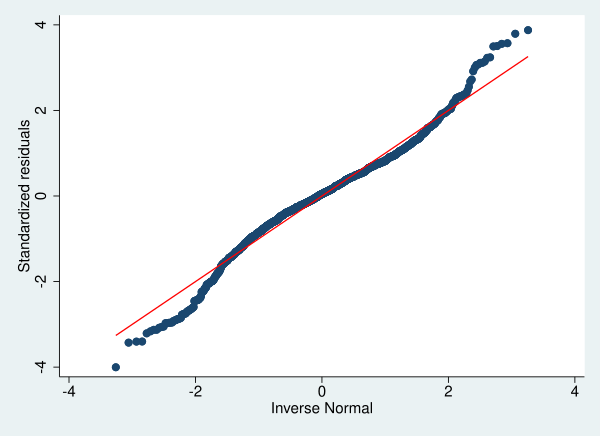




(bin=32, start=-4.0026555, width=.2462039)


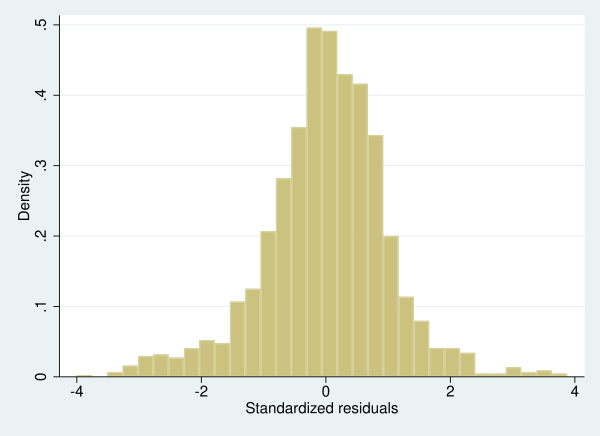




                   Shapiro-Wilk W test for normal data

    Variable |        Obs       W           V         z       Prob>z
-------------+------------------------------------------------------
      restan |      1,785    0.97534     26.376     8.289    0.00000


In [12]:
//Normalidad
qnorm restan, rlopts(lcolor(red) )
hist restan  

//Prueba formal
swilk restan

Aunque la distribución esta centrada en cero y no parece tener una asimetría fuerte, es una distribución que tiene colas pesadas con muchas observaciones con valores superiores a |2|. Para comprobar formalmente si la distirbución de los errores estandarizados es estadísticamente igual a la normal realizamos la prueba de Shapiro-Wilk cuyo sistema de hipótesis consiste en: 

$$Ho: \epsilon \sim N$$

$$Ho: \epsilon \neq N$$

La prueba arroja un valor p < 0.01, por lo que tenemos suficiente evidencia para no rechazar Ho, y podemos afirmar que la distribución de los errores estandarizados no es normal. 

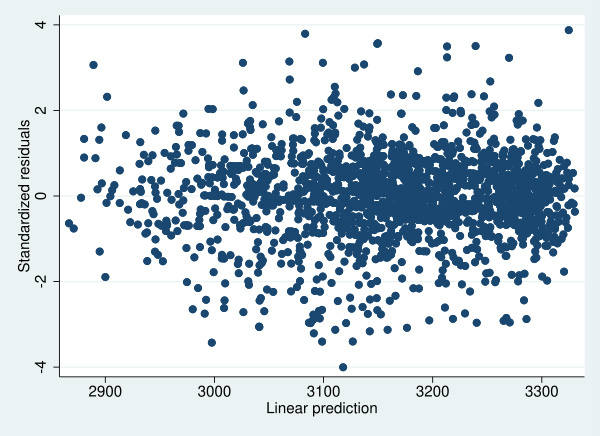




(1,654 missing values generated)

(1,654 real changes made)


      grupo |      Freq.     Percent        Cum.
------------+-----------------------------------
          1 |        177        9.67        9.67
          2 |      1,654       90.33      100.00
------------+-----------------------------------
      Total |      1,831      100.00


                        Analysis of Variance
    Source              SS         df      MS            F     Prob > F
------------------------------------------------------------------------
Between groups      .056237796      1   .056237796      0.06     0.8127
 Within groups      1785.00351   1783   1.00112367
------------------------------------------------------------------------
    Total           1785.05975   1784   1.00059403

Bartlett's test for equal variances:  chi2(1) =   0.7902  Prob>chi2 = 0.374

La prueba de Bartlett presenta un valor de p > 0.05. Podemos asumir que se cumpl
> e el supuesto de varianza constante.


In [13]:
//Varianza constante
twoway scatter restan yhat

gen grupo = 1 if yhat<=3020
replace grupo = 2 if yhat>3020 

tab grupo 
oneway restan grupo

dis "La prueba de Bartlett presenta un valor de p > 0.05. Podemos asumir que se cumple el supuesto de varianza constante."

El supuesto de varianza constanre significa que la dispersión de nuestros errores es estadísticamente igual para cualquier valor estimado de y. En la gráfica no se evidencia un patrón entre los errores estandarizados y nuestra variable dependiente, sin embargo, si observamos con más detalle, podrían existir dos grupos con varianza diferente. Los grupos son (i) aquellos con un peso menor a 3020 gramos y (ii) quienes tienen un peso mayor a 3020 gramos. Con estos grupos realizamos el test de Bartlett. El sistema de hipótesis de la prueba consiste en: 

$$Ho: \sigma^2_{1} = \sigma^2_{2}$$
$$Ha: \sigma^2_{1} \neq \sigma^2_{2}$$

De esta prueba obtenemos un valor p igual a 0.374, por lo que no tenemos suficiente evidencia para rechazar Ho y podemos concluir que las varianzas de los grupos elegidos no son estadísticamente diferentes. Esto implica que el supuesto de homocedasticidad se cumple. 

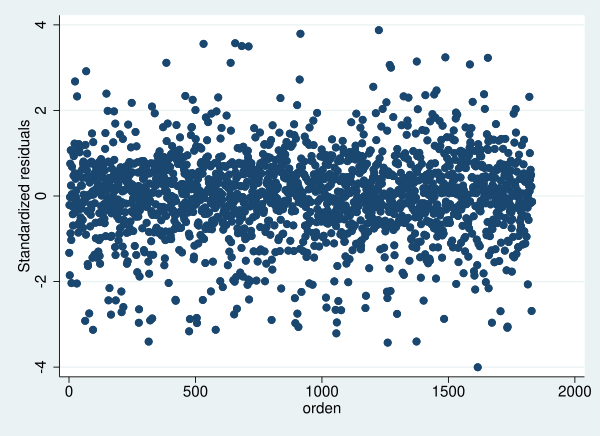





        time variable:  tiempo, 1 to 1831
                delta:  1 unit


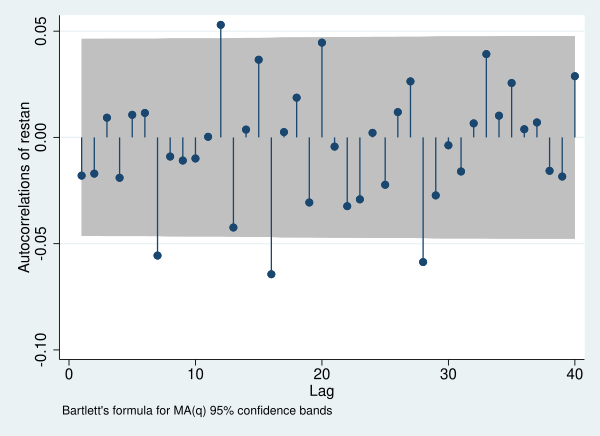




(obs=1,785)

             |   restan    orden
-------------+------------------
      restan |   1.0000
       orden |   0.0252   1.0000



      Source |       SS           df       MS      Number of obs   =     1,785
-------------+----------------------------------   F(1, 1783)      =      1.13
       Model |  1.13088772         1  1.13088772   Prob > F        =    0.2879
    Residual |  1783.92886     1,783  1.00052095   R-squared       =    0.0006
-------------+----------------------------------   Adj R-squared   =    0.0001
       Total |  1785.05975     1,784  1.00059403   Root MSE        =    1.0003

------------------------------------------------------------------------------
      restan |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
       orden |   .0000476   .0000447     1.06   0.288    -.0000402    .0001353
       _cons |  -.0434792   .0472544    -0.92   0.358     -.136159 

In [17]:
//Independencia
twoway scatter  restan orden
//ACF
gen tiempo = _n
tsset tiempo 
ac restan
//Correlación
correlate restan orden
//Regresión
reg restan orden    

Este supuesto consiste en comprobar que los errores del individuo i no afectan los errores del individuo j. Esto implica que el orden en el que fueron tomadas las observaciones no debe mostrar un patrón o relación con los errores estandarizados. Los resultaos indican que no parece existir una correlación entre los errores estandarizados. No obstante, no estamos seguros si el orden en el que se encuentran las observaciones de la base de datos es el orden en el que realmente se realizaron las observaciones. Este supuesto muchas veces se debe justificar a partir de las estrategias de muestreo que se utilizan para recolectar la muestra. Adicionalmente es importante considerar que no siempre la correlación de las observaciones se da en la dimensión temporal sino que también se puede dar en la dimensión espacial. Para explorar correlación espacial se pueden utilizar técnicas clásicas como el índice de Moran Global y Local (les subo un documento en pdf aparte que fue realizado en python para que se den una idea de cómo funcionan estos métodos por si les interesa). 

## Regresión logística


**Explorar si existe una asociación entre asistir o no a una consulta prenatal y vivir en un area urbana o rural**

Para este ejercicio vamos a utilizar los datos de la Encuesta de Demografía y Salud de Bangladesh (BDHS) que es un
una encuesta transversal representativa a nivel nacional de mujeres en edad reproductiva (13-49 años).

Nuestra variable de respuesta (antemed, 1 si recibió atención prenatal) es un indicador binario de si una mujer recibió atención prenatal de un proveedor capacitado médicamente (un médico, enfermera o partera) al menos una vez antes de su último nacimiento vivo. Para minimizar los errores de recuerdo, la pregunta se hizo solo sobre los niños nacidos dentro de los cinco años de la encuesta. Por esta razón, la muestra de análisis está restringida a mujeres que tuvieron un nacimiento vivo en el período de cinco años antes de la encuesta. Tenga en cuenta que si una mujer tuvo más de un nacimiento vivo durante el período de referencia, se considera solo el más reciente.

Como variable predictora utilizamos el indicador si la mujer vivía en una zona urbana o rural en el momento de la encuesta (urban, 1 si vive en una zona urbana). 

In [19]:
*Cargar base de datos:
use reglogistica, clear
*describir base de datos
describe
*visualizr
list antemed urban in 1/20




Contains data from reglogistica.dta
  obs:         5,366                          
 vars:            18                          12 Feb 2010 14:49
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
comm            int     %9.0g                 Community ID
womid           int     %9.0g                 Woman ID
antemed         byte    %9.0g                 Antenatal from qualified medic
bord            byte    %9.0g                 Birth order
mage            byte    %9.0g                 Mother's age at birth
urban           byte    %9.0g                 Type of region of residence
meduc           byte    %9.0g                 Maternal education
islam           byte    %9.0g                 Religion
wealth          byte    %9.0g                 Wealth index (1 = poorest)
ma

**Un poco de teoría sobre regresión logística**

En muchas aplicaciones, la variables Y que queremos modelar en prescencia de unas variables explicativas X, no se puede poner en el contexto de un modelo de regresión lineal.
En términos generales, para el modelo de regresión lineal se tenía:

1. Una variabe de respuesta Y continua con rango en ($-\inf$;$\inf$)
2. Un modelo en el cual la media era separable de la dispersión (varianza) de los datos
3. Se suponía normalidad en los errores y varianza homogenea.

Estas condiciones son limitantes en muchas ocasiones.


En este caso se quiere explicar una variable categórica Y que sólamente tiene dos opciones. Esto corresponde a una distribución Y ~ Bernoulli(p), donde p = P(Y = 1). Esto quiere decir que en la regresión logística vamos a estimar una probabilidad p para una combinación lineal de variables independientes. 

Dado que la distribución Bernoulli pertenece a la familia exponencial, podemos usar:
$p_{x} = P(Y = 1|X) = g(\beta_{0} + \beta_{1}X1 + ... + \beta_{k}Xk) = g(\eta)$

dónde g(n) es el logit, que es el link que permite enlazar las variables independientes con la distribución de bernouilli. 

<img src="RegLogistica3.png">


**Ejercicio 3.1**

Ajuste un modelo de regresión logística y responda: ¿Qué puede decir de la asociación entre asistir o no a una consulta prenatal y vivir en un area urbana o rural? 

In [20]:
logistic antemed i.urban
logistic antemed i.urban, coef 
dis exp(1.2597)
*ecuación: log-odds atención prenatal = -0.324 + 1.26*x



Logistic regression                             Number of obs     =      5,366
                                                LR chi2(1)        =     423.51
                                                Prob > chi2       =     0.0000
Log likelihood = -3505.8466                     Pseudo R2         =     0.0570

------------------------------------------------------------------------------
     antemed | Odds Ratio   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
     1.urban |   3.524464   .2242342    19.80   0.000      3.11127    3.992532
       _cons |   .7221703   .0241187    -9.75   0.000     .6764124    .7710235
------------------------------------------------------------------------------
Note: _cons estimates baseline odds.


Logistic regression                             Number of obs     =      5,366
                                                LR chi2(1)        =     423.51
          

**Respuesta Ejercicio 3.1**

Modelo: 

$log(\frac{p}{1-p})=\beta_{0}+\beta_{1}*Urban$

$log(\frac{p}{1-p})= -0.324 + 1.26*x$

Los resultados del análsis multivariado indican que el modelo es significativo ($LR_{global}>\chi^2_{0.95,1}$). Además, a partir del test de Wald, la variable que identifica si la persona vive en zona rural o urbana es significativa. Esto quiere decir que la variable Urbana tiene la capacidad de explicar la probabilidad de asistir o no a una consulta prenatal. Podemos ver que  el odds de asistir a consulta prenatal para las personas que viven en zona rural es 3.5 (IC95\%:  3.11; 3.99) veces el odds de asistir a consulta prenatal comparado con las personas que viven en área rural.